In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.style as style
import geopandas
import datetime as dt
import geopy
import helper
import matplotlib.lines as mlines

style.use('fivethirtyeight')

plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

#### Load Data

In [2]:
# Only going to be looking at Citi Bike data from March and April of 2021
citi = helper.get_all_citi_df(start_month=3, start_year=2021)


#### Add zipcode field

In [3]:
# Load previously processed stations and their corresponding zipcodes and check for
# station id's with no corresponding zipcodes
station_zipcode = pd.read_csv(r'station_zipcode.csv',
                   index_col=0,)
zipcode_dict = dict(zip(station_zipcode.station_id, station_zipcode.zipcode))
id_to_zipcode = helper.update_zip_code_dict(citi,zipcode_dict)

# mapping statin ID to zip code
citi["start_zipcode"] = citi["Start Station ID"].map(id_to_zipcode)
citi["end_zipcode"] = citi["End Station ID"].map(id_to_zipcode)

# save station to zip code mapping for future use if there were new zip codes added.
id_to_zipcode_df = pd.DataFrame(id_to_zipcode.items(), columns=['station_id', 'zipcode'])
id_to_zipcode_df.to_csv('station_zipcode.csv')

No new ZIP codes.


#### Keep only important features.

In [4]:
# Removing unessential columns
citi = citi[['Trip Duration', 'Start Time', 
               'Start Station Name', 'Start Station Latitude',
               'Start Station Longitude', 'End Station Name',
               'End Station Latitude', 'End Station Longitude', 
               'start_zipcode', 'end_zipcode']]
# Removing trips that are over an hour and half long.
trip_duration_extreme = citi["Trip Duration"].quantile(0.99)
citi = citi[(citi["Trip Duration"] < trip_duration_extreme)].reset_index(drop=True)

# Adding hour and weekday columns.
citi['hour'] = citi['Start Time'].dt.hour
# citi['day'] = citi['Start Time'].dt.day
citi['weekday'] = citi['Start Time'].dt.weekday


#### Loading NYC maps to improve graphs.

In [5]:
# NYC zip codes.
gnyc_zip = geopandas.read_file("nyc_zip_codes/ZIP_CODE_040114.shp")  
gnyc_zip = gnyc_zip.to_crs("EPSG:4326") # axis are now in lat/long format
nyc_zip_list = list(gnyc_zip.ZIPCODE)
# NYC University/Colleges
gschool = geopandas.read_file('nyc_schools/geo_export_b7c28c3f-1653-45c2-b34c-777952dfbaef.shp')
# NYC subway stations.
gsub_stations = geopandas.read_file("nyc_subway_stations/geo_export_09ee98e9-27d8-446f-bb37-c37557e74463.shp")  
# NYC subway lines. And a color mapping for the subway lines.
gsub_lines = geopandas.read_file("nyc_subway_lines/geo_export_dcdd1f9d-0a28-4d93-8b36-619951fd4f21.shp") 
subway_color_mapping = {'G':'#6cbe45', 
                        'N':'#fccc0a', 
                        'B':'#ff6319', 
                        'L':'#a7a9ac', 
                        'A':'#0039a6', 
                        '7':'#b933ad', 
                        'J':'#996633', 
                        '1':'#ee352e', 
                        '4':'#00933c'}
# NYC Hospitals.
health = pd.read_csv(r'Health_Facility_Map.csv',)
health = health[health['Description']=='Hospital']
health = health[health['Facility Zip Code'].isin(nyc_zip_list)].reset_index(drop = True)
ghealth = geopandas.GeoDataFrame(
                health, 
                geometry=geopandas.points_from_xy(health['Facility Longitude'], 
                                                  health['Facility Latitude']))

In [6]:
# Removing all trips that go to New Jersey or random ferry islands.
citi = citi[citi['start_zipcode'].isin(nyc_zip_list)]
citi = citi[citi['end_zipcode'].isin(nyc_zip_list)]

#### Set data up to visualize

In [7]:
# Find the net incrase/decrease at each station in each hour.
# find count of trips ending and starting at each station 
start_station_agg = citi.groupby(['hour','Start Station Name']).count()['start_zipcode'].sort_values().reset_index()
end_station_agg = citi.groupby(['hour','End Station Name']).count()['end_zipcode'].sort_values().reset_index()

station_count = pd.merge(start_station_agg, end_station_agg,  
                              how='inner', 
                              left_on=['Start Station Name','hour'], 
                              right_on = ['End Station Name','hour'])

station_count = station_count[['hour','Start Station Name',
                         'start_zipcode','end_zipcode']]
station_count.rename(columns={'Start Station Name':'station',
                           'start_zipcode':'leaving',
                           'end_zipcode':'arriving'},
                     inplace=True)

# count the net increase/decrease per day at that hour
station_count['net'] = station_count['arriving']-station_count['leaving']
num_days = len(citi['Start Time'].dt.normalize().unique())
station_count['net_day'] = station_count['net']/num_days


#### East Village Maps

<ipython-input-8-150cbf3fdee2>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  citi_hour['total_trips'] = citi_hour['leaving'] + citi_hour['arriving']


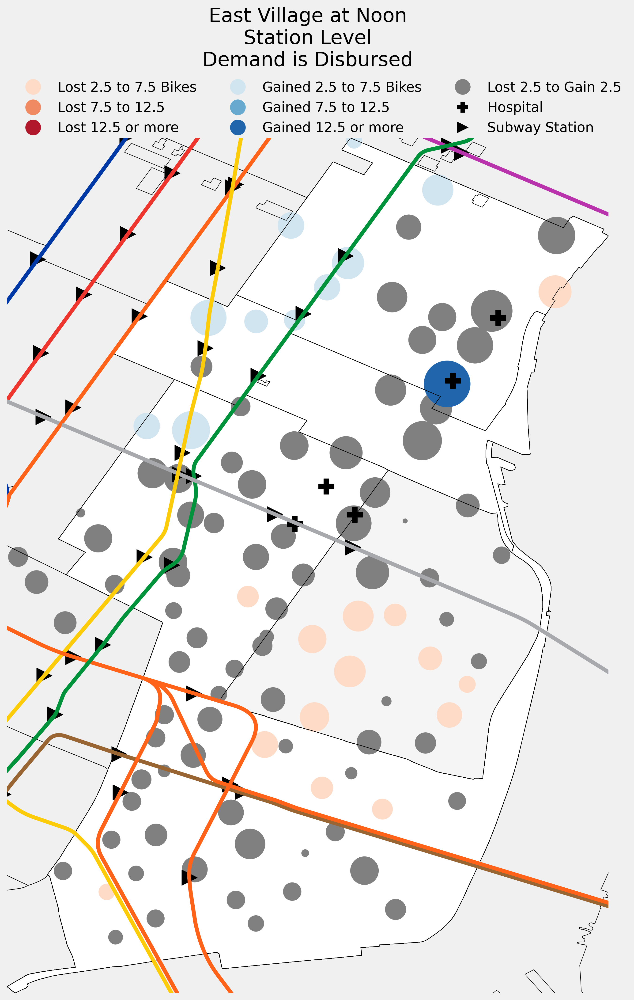

In [8]:
hour = 12

citi_hour = station_count[station_count['hour'] == hour]
citi_hour['total_trips'] = citi_hour['leaving'] + citi_hour['arriving']
citi_hour = citi_hour.merge(citi,how = 'left',
                        left_on = 'station', 
                        right_on = 'Start Station Name').drop_duplicates('station')
near_evil_zips = ['10009','10002','10003','10010','10016']
near_evil = citi_hour[citi_hour['start_zipcode'].isin(near_evil_zips)]
near_evil = near_evil[['station','net_day',
                       'Start Station Latitude','Start Station Longitude',
                       'start_zipcode','hour_x','total_trips']].reset_index(drop=True)

near_evil_zips = gnyc_zip.merge(near_evil, right_on='start_zipcode' ,left_on='ZIPCODE')

gnear_evil = geopandas.GeoDataFrame(
                near_evil, 
                geometry=geopandas.points_from_xy(near_evil['Start Station Longitude'], 
                                                  near_evil['Start Station Latitude']))
gnear_evil.loc[gnear_evil["net_day"] <= -12.5,
               "net_day_cat"] = -3
gnear_evil.loc[((gnear_evil["net_day"] > -12.5) & (gnear_evil["net_day"] <= -7.5)),
               "net_day_cat"] = -2
gnear_evil.loc[((gnear_evil["net_day"] > -7.5) & (gnear_evil["net_day"] <= -2.5)),
               "net_day_cat"] = -1
gnear_evil.loc[((gnear_evil["net_day"] > -2.5) & (gnear_evil["net_day"] <= 2.5)),
               "net_day_cat"] = 0
gnear_evil.loc[((gnear_evil["net_day"] > 2.5) & (gnear_evil["net_day"] <= 7.5)),
               "net_day_cat"] = 1
gnear_evil.loc[((gnear_evil["net_day"] > 7.5) & (gnear_evil["net_day"] <= 12.5)),
               "net_day_cat"] = 2
gnear_evil.loc[gnear_evil["net_day"] > 12.5, "net_day_cat"] = 3
cat_color_mapping = {-3:'#b2182b',
                     -2:'#ef8a62',
                     -1:'#fddbc7',
                     0:'grey',
                     1:'#d1e5f0',
                     2:'#67a9cf',
                     3:'#2166ac'}

fig,ax = plt.subplots(figsize = (15, 15))

zip_boundry_map = gnyc_zip.boundary.plot(color='Black', linewidth=.5,ax=ax)
zip_color_mapping = {'10016':'white', 
                     '10010':'white', 
                     '10003':'white', 
                     '10002':'white', 
                     '10009':'#f5f5f5'}
near_evil_zips.plot(color=near_evil_zips['ZIPCODE'].map(zip_color_mapping), 
                    edgecolor='black',ax=zip_boundry_map)
gnear_evil.plot(ax=zip_boundry_map,
                color=gnear_evil["net_day_cat"].map(cat_color_mapping),
                markersize=near_evil['total_trips'],
                )

gsub_lines.plot(color=gsub_lines["rt_symbol"].map(subway_color_mapping),
                  ax=zip_boundry_map)
gsub_stations.plot(marker=">",markersize = 250,
                     ax=zip_boundry_map,color = 'black')
ghealth.plot(ax=zip_boundry_map,marker="P",markersize = 250,color='black')
# gschool.plot(ax=zip_boundry_map,marker="s",markersize = 250,color='#476072')

zip_boundry_map.axis('off')


minx, miny, maxx, maxy = near_evil_zips.total_bounds
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)
ax.set_title('East Village at Noon\nStation Level\nDemand is Disbursed\n\n\n');

hospital = mlines.Line2D([], [], color='black', marker='P', linestyle='None',
                          markersize=10, label='Hospital')
subway = mlines.Line2D([], [], color='black', marker='>', linestyle='None',
                          markersize=10, label='Subway Station')
circle_3 = mlines.Line2D([], [], color='#b2182b', marker='.', linestyle='None',
                          markersize=30, label='Lost 12.5 or more')
circle_2 = mlines.Line2D([], [], color='#ef8a62', marker='.', linestyle='None',
                          markersize=30, label='Lost 7.5 to 12.5')
circle_1 = mlines.Line2D([], [], color='#fddbc7', marker='.', linestyle='None',
                          markersize=30, label='Lost 2.5 to 7.5 Bikes')
circle = mlines.Line2D([], [], color='grey', marker='.', linestyle='None',
                          markersize=30, label='Lost 2.5 to Gain 2.5')
circle1 = mlines.Line2D([], [], color='#d1e5f0', marker='.', linestyle='None',
                          markersize=30, label='Gained 2.5 to 7.5 Bikes')
circle2 = mlines.Line2D([], [], color='#67a9cf', marker='.', linestyle='None',
                          markersize=30, label='Gained 7.5 to 12.5')
circle3 = mlines.Line2D([], [], color='#2166ac', marker='.', linestyle='None',
                          markersize=30, label='Gained 12.5 or more')

plt.legend(handles=[circle_1, circle_2, circle_3, circle1, circle2, circle3, circle,
                    hospital, subway],
           loc='center left', 
               bbox_to_anchor=(0, 1.035),frameon=False,ncol=3,
                    title = '')

plt.show()

<ipython-input-9-be399dbfed44>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  citi_hour['total_trips'] = citi_hour['leaving'] + citi_hour['arriving']


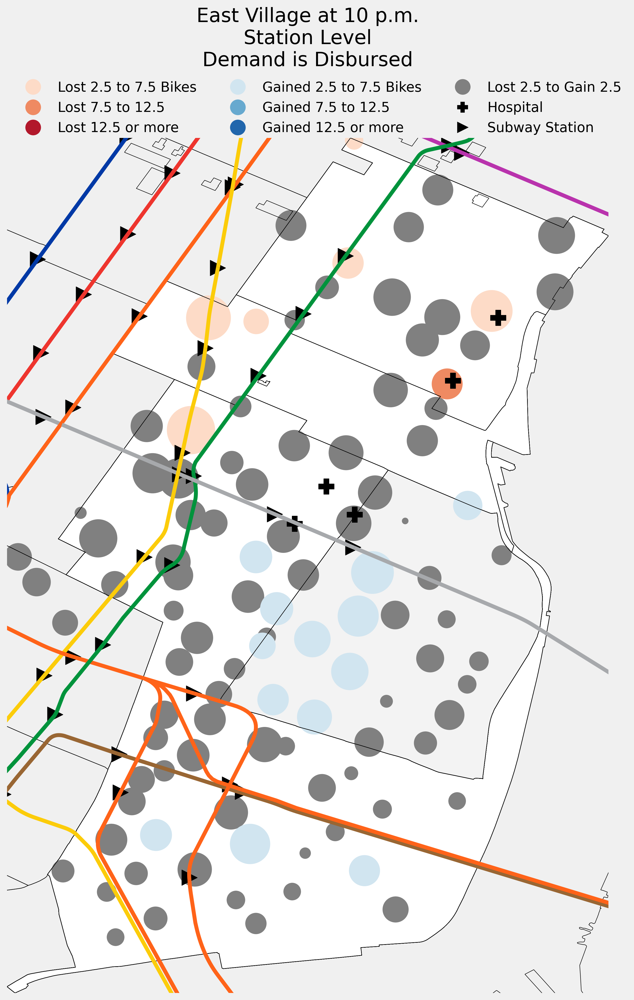

In [9]:
# create axis
fig,ax = plt.subplots(figsize = (15, 15))
## set up data for graph
# limit data to hour of interest
hour = 22
citi_hour = station_count[station_count['hour'] == hour]
citi_hour['total_trips'] = citi_hour['leaving'] + citi_hour['arriving']
citi_hour = citi_hour.merge(citi,how = 'left',
                        left_on = 'station', 
                        right_on = 'Start Station Name').drop_duplicates('station')
# limit data to zip codes of interest
near_evil_zips = ['10009','10002','10003','10010','10016']
near_evil = citi_hour[citi_hour['start_zipcode'].isin(near_evil_zips)]
near_evil = near_evil[['station','net_day',
                       'Start Station Latitude','Start Station Longitude',
                       'start_zipcode','hour_x','total_trips']].reset_index(drop=True)
near_evil_zips = gnyc_zip.merge(near_evil, right_on='start_zipcode' ,left_on='ZIPCODE')
gnear_evil = geopandas.GeoDataFrame(
                near_evil, 
                geometry=geopandas.points_from_xy(near_evil['Start Station Longitude'], 
                                                  near_evil['Start Station Latitude']))
# bin net gain/loss values 
gnear_evil.loc[gnear_evil["net_day"] <= -12.5,
               "net_day_cat"] = -3
gnear_evil.loc[((gnear_evil["net_day"] > -12.5) & (gnear_evil["net_day"] <= -7.5)),
               "net_day_cat"] = -2
gnear_evil.loc[((gnear_evil["net_day"] > -7.5) & (gnear_evil["net_day"] <= -2.5)),
               "net_day_cat"] = -1
gnear_evil.loc[((gnear_evil["net_day"] > -2.5) & (gnear_evil["net_day"] <= 2.5)),
               "net_day_cat"] = 0
gnear_evil.loc[((gnear_evil["net_day"] > 2.5) & (gnear_evil["net_day"] <= 7.5)),
               "net_day_cat"] = 1
gnear_evil.loc[((gnear_evil["net_day"] > 7.5) & (gnear_evil["net_day"] <= 12.5)),
               "net_day_cat"] = 2
gnear_evil.loc[gnear_evil["net_day"] > 12.5, "net_day_cat"] = 3
cat_color_mapping = {-3:'#b2182b',
                     -2:'#ef8a62',
                     -1:'#fddbc7',
                     0:'grey',
                     1:'#d1e5f0',
                     2:'#67a9cf',
                     3:'#2166ac'}
## graph map
# outline of zip codes
zip_boundry_map = gnyc_zip.boundary.plot(color='Black', linewidth=.5,ax=ax)
# fill in zip codes of interest
zip_color_mapping = {'10016':'white', 
                     '10010':'white', 
                     '10003':'white', 
                     '10002':'white', 
                     '10009':'#f3f3f3'}
near_evil_zips.plot(color=near_evil_zips['ZIPCODE'].map(zip_color_mapping), 
                    edgecolor='black',ax=zip_boundry_map)
# graph station traffic
gnear_evil.plot(ax=zip_boundry_map,
                color=gnear_evil["net_day_cat"].map(cat_color_mapping),
                markersize=near_evil['total_trips']*.75,)
# graph subway. lines and stations.
gsub_lines.plot(color=gsub_lines["rt_symbol"].map(subway_color_mapping),
                  ax=zip_boundry_map)
gsub_stations.plot(marker=">",markersize = 250,
                     ax=zip_boundry_map,color = 'black')
# graph hospital
ghealth.plot(ax=zip_boundry_map,marker="P",markersize = 250,color='black')
# limit map to areas of interest
zip_boundry_map.axis('off')
minx, miny, maxx, maxy = near_evil_zips.total_bounds
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)

# title
ax.set_title('East Village at 10 p.m.\nStation Level\nDemand is Disbursed\n\n\n')
# legend
hospital = mlines.Line2D([], [], color='black', marker='P', linestyle='None',
                          markersize=10, label='Hospital')
subway = mlines.Line2D([], [], color='black', marker='>', linestyle='None',
                          markersize=10, label='Subway Station')
circle_3 = mlines.Line2D([], [], color='#b2182b', marker='.', linestyle='None',
                          markersize=30, label='Lost 12.5 or more')
circle_2 = mlines.Line2D([], [], color='#ef8a62', marker='.', linestyle='None',
                          markersize=30, label='Lost 7.5 to 12.5')
circle_1 = mlines.Line2D([], [], color='#fddbc7', marker='.', linestyle='None',
                          markersize=30, label='Lost 2.5 to 7.5 Bikes')
circle = mlines.Line2D([], [], color='grey', marker='.', linestyle='None',
                          markersize=30, label='Lost 2.5 to Gain 2.5')
circle1 = mlines.Line2D([], [], color='#d1e5f0', marker='.', linestyle='None',
                          markersize=30, label='Gained 2.5 to 7.5 Bikes')
circle2 = mlines.Line2D([], [], color='#67a9cf', marker='.', linestyle='None',
                          markersize=30, label='Gained 7.5 to 12.5')
circle3 = mlines.Line2D([], [], color='#2166ac', marker='.', linestyle='None',
                          markersize=30, label='Gained 12.5 or more')
plt.legend(handles=[circle_1, circle_2, circle_3, circle1, circle2, circle3, circle,
                    hospital, subway],
           loc='center left', 
               bbox_to_anchor=(0, 1.035),frameon=False,ncol=3,
                    title = '')

plt.show()

<ipython-input-10-6db9dc9da4f7>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  citi_hour['total_trips'] = citi_hour['leaving'] + citi_hour['arriving']
<ipython-input-10-6db9dc9da4f7>:77: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  citi_hour['total_trips'] = citi_hour['leaving'] + citi_hour['arriving']


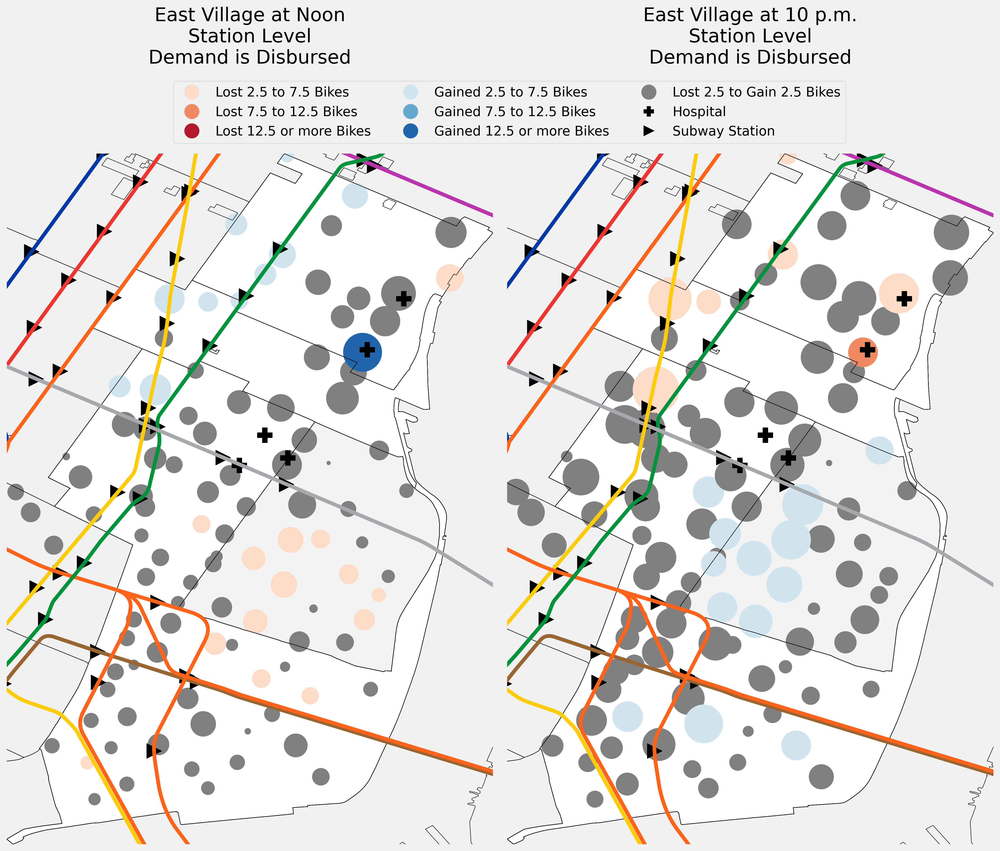

In [10]:
# create axis
fig,(ax1,ax2) = plt.subplots(1,2,figsize = (15, 15))
## set up data for graph
# limit data to hour of interest
hour = 12
citi_hour = station_count[station_count['hour'] == hour]
citi_hour['total_trips'] = citi_hour['leaving'] + citi_hour['arriving']
citi_hour = citi_hour.merge(citi,how = 'left',
                        left_on = 'station', 
                        right_on = 'Start Station Name').drop_duplicates('station')
# limit data to zip codes of interest
near_evil_zips = ['10009','10002','10003','10010','10016']
near_evil = citi_hour[citi_hour['start_zipcode'].isin(near_evil_zips)]
near_evil = near_evil[['station','net_day',
                       'Start Station Latitude','Start Station Longitude',
                       'start_zipcode','hour_x','total_trips']].reset_index(drop=True)
near_evil_zips = gnyc_zip.merge(near_evil, right_on='start_zipcode' ,left_on='ZIPCODE')
gnear_evil = geopandas.GeoDataFrame(
                near_evil, 
                geometry=geopandas.points_from_xy(near_evil['Start Station Longitude'], 
                                                  near_evil['Start Station Latitude']))
# bin net gain/loss values 
gnear_evil.loc[gnear_evil["net_day"] <= -12.5,
               "net_day_cat"] = -3
gnear_evil.loc[((gnear_evil["net_day"] > -12.5) & (gnear_evil["net_day"] <= -7.5)),
               "net_day_cat"] = -2
gnear_evil.loc[((gnear_evil["net_day"] > -7.5) & (gnear_evil["net_day"] <= -2.5)),
               "net_day_cat"] = -1
gnear_evil.loc[((gnear_evil["net_day"] > -2.5) & (gnear_evil["net_day"] <= 2.5)),
               "net_day_cat"] = 0
gnear_evil.loc[((gnear_evil["net_day"] > 2.5) & (gnear_evil["net_day"] <= 7.5)),
               "net_day_cat"] = 1
gnear_evil.loc[((gnear_evil["net_day"] > 7.5) & (gnear_evil["net_day"] <= 12.5)),
               "net_day_cat"] = 2
gnear_evil.loc[gnear_evil["net_day"] > 12.5, "net_day_cat"] = 3
cat_color_mapping = {-3:'#b2182b',
                     -2:'#ef8a62',
                     -1:'#fddbc7',
                     0:'grey',
                     1:'#d1e5f0',
                     2:'#67a9cf',
                     3:'#2166ac'}
## graph map
# outline of zip codes
zip_boundry_map = gnyc_zip.boundary.plot(color='Black', linewidth=.5,ax=ax1)
# fill in zip codes of interest
zip_color_mapping = {'10016':'white', 
                     '10010':'white', 
                     '10003':'white', 
                     '10002':'white', 
                     '10009':'#f3f3f3'}
near_evil_zips.plot(color=near_evil_zips['ZIPCODE'].map(zip_color_mapping), 
                    edgecolor='black',ax=zip_boundry_map)
# graph station traffic
gnear_evil.plot(ax=zip_boundry_map,
                color=gnear_evil["net_day_cat"].map(cat_color_mapping),
                markersize=near_evil['total_trips']*.75,)
# graph subway. lines and stations.
gsub_lines.plot(color=gsub_lines["rt_symbol"].map(subway_color_mapping),
                  ax=zip_boundry_map)
gsub_stations.plot(marker=">",markersize = 250,
                     ax=zip_boundry_map,color = 'black')
# graph hospital
ghealth.plot(ax=zip_boundry_map,marker="P",markersize = 250,color='black')
# limit map to areas of interest
zip_boundry_map.axis('off')
minx, miny, maxx, maxy = near_evil_zips.total_bounds
ax1.set_xlim(minx, maxx)
ax1.set_ylim(miny, maxy)
# title
ax1.set_title('East Village at Noon\nStation Level\nDemand is Disbursed\n\n\n\n')

## set up data for graph
# limit data to hour of interest
hour = 22
citi_hour = station_count[station_count['hour'] == hour]
citi_hour['total_trips'] = citi_hour['leaving'] + citi_hour['arriving']
citi_hour = citi_hour.merge(citi,how = 'left',
                        left_on = 'station', 
                        right_on = 'Start Station Name').drop_duplicates('station')
# limit data to zip codes of interest
near_evil_zips = ['10009','10002','10003','10010','10016']
near_evil = citi_hour[citi_hour['start_zipcode'].isin(near_evil_zips)]
near_evil = near_evil[['station','net_day',
                       'Start Station Latitude','Start Station Longitude',
                       'start_zipcode','hour_x','total_trips']].reset_index(drop=True)
near_evil_zips = gnyc_zip.merge(near_evil, right_on='start_zipcode' ,left_on='ZIPCODE')
gnear_evil = geopandas.GeoDataFrame(
                near_evil, 
                geometry=geopandas.points_from_xy(near_evil['Start Station Longitude'], 
                                                  near_evil['Start Station Latitude']))
# bin net gain/loss values 
gnear_evil.loc[gnear_evil["net_day"] <= -12.5,
               "net_day_cat"] = -3
gnear_evil.loc[((gnear_evil["net_day"] > -12.5) & (gnear_evil["net_day"] <= -7.5)),
               "net_day_cat"] = -2
gnear_evil.loc[((gnear_evil["net_day"] > -7.5) & (gnear_evil["net_day"] <= -2.5)),
               "net_day_cat"] = -1
gnear_evil.loc[((gnear_evil["net_day"] > -2.5) & (gnear_evil["net_day"] <= 2.5)),
               "net_day_cat"] = 0
gnear_evil.loc[((gnear_evil["net_day"] > 2.5) & (gnear_evil["net_day"] <= 7.5)),
               "net_day_cat"] = 1
gnear_evil.loc[((gnear_evil["net_day"] > 7.5) & (gnear_evil["net_day"] <= 12.5)),
               "net_day_cat"] = 2
gnear_evil.loc[gnear_evil["net_day"] > 12.5, "net_day_cat"] = 3
cat_color_mapping = {-3:'#b2182b',
                     -2:'#ef8a62',
                     -1:'#fddbc7',
                     0:'grey',
                     1:'#d1e5f0',
                     2:'#67a9cf',
                     3:'#2166ac'}
## graph map
# outline of zip codes
zip_boundry_map = gnyc_zip.boundary.plot(color='Black', linewidth=.5,ax=ax2)
# fill in zip codes of interest
zip_color_mapping = {'10016':'white', 
                     '10010':'white', 
                     '10003':'white', 
                     '10002':'white', 
                     '10009':'#f3f3f3'}
near_evil_zips.plot(color=near_evil_zips['ZIPCODE'].map(zip_color_mapping), 
                    edgecolor='black',ax=zip_boundry_map)
# graph station traffic
gnear_evil.plot(ax=zip_boundry_map,
                color=gnear_evil["net_day_cat"].map(cat_color_mapping),
                markersize=near_evil['total_trips']*.75,)
# graph subway. lines and stations.
gsub_lines.plot(color=gsub_lines["rt_symbol"].map(subway_color_mapping),
                  ax=zip_boundry_map)
gsub_stations.plot(marker=">",markersize = 250,
                     ax=zip_boundry_map,color = 'black')
# graph hospital
ghealth.plot(ax=zip_boundry_map,marker="P",markersize = 250,color='black')
# limit map to areas of interest
zip_boundry_map.axis('off')
minx, miny, maxx, maxy = near_evil_zips.total_bounds
ax2.set_xlim(minx, maxx)
ax2.set_ylim(miny, maxy)
# title
ax2.set_title('East Village at 10 p.m.\nStation Level\nDemand is Disbursed\n\n\n\n')
fig.tight_layout()
# legend
hospital = mlines.Line2D([], [], color='black', marker='P', linestyle='None',
                          markersize=10, label='Hospital')
subway = mlines.Line2D([], [], color='black', marker='>', linestyle='None',
                          markersize=10, label='Subway Station')
circle_3 = mlines.Line2D([], [], color='#b2182b', marker='.', linestyle='None',
                          markersize=30, label='Lost 12.5 or more Bikes')
circle_2 = mlines.Line2D([], [], color='#ef8a62', marker='.', linestyle='None',
                          markersize=30, label='Lost 7.5 to 12.5 Bikes')
circle_1 = mlines.Line2D([], [], color='#fddbc7', marker='.', linestyle='None',
                          markersize=30, label='Lost 2.5 to 7.5 Bikes')
circle = mlines.Line2D([], [], color='grey', marker='.', linestyle='None',
                          markersize=30, label='Lost 2.5 to Gain 2.5 Bikes')
circle1 = mlines.Line2D([], [], color='#d1e5f0', marker='.', linestyle='None',
                          markersize=30, label='Gained 2.5 to 7.5 Bikes')
circle2 = mlines.Line2D([], [], color='#67a9cf', marker='.', linestyle='None',
                          markersize=30, label='Gained 7.5 to 12.5 Bikes')
circle3 = mlines.Line2D([], [], color='#2166ac', marker='.', linestyle='None',
                          markersize=30, label='Gained 12.5 or more Bikes')
plt.legend(handles=[circle_1, circle_2, circle_3, circle1, circle2, circle3, circle, hospital, subway],
           loc='center left', bbox_to_anchor=(-.7, 1.06), frameon=True, ncol=3, title = '')
plt.show()

#### Upper east side

<ipython-input-11-e8943bd4c162>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  citi_hour['total_trips'] = citi_hour['leaving'] + citi_hour['arriving']


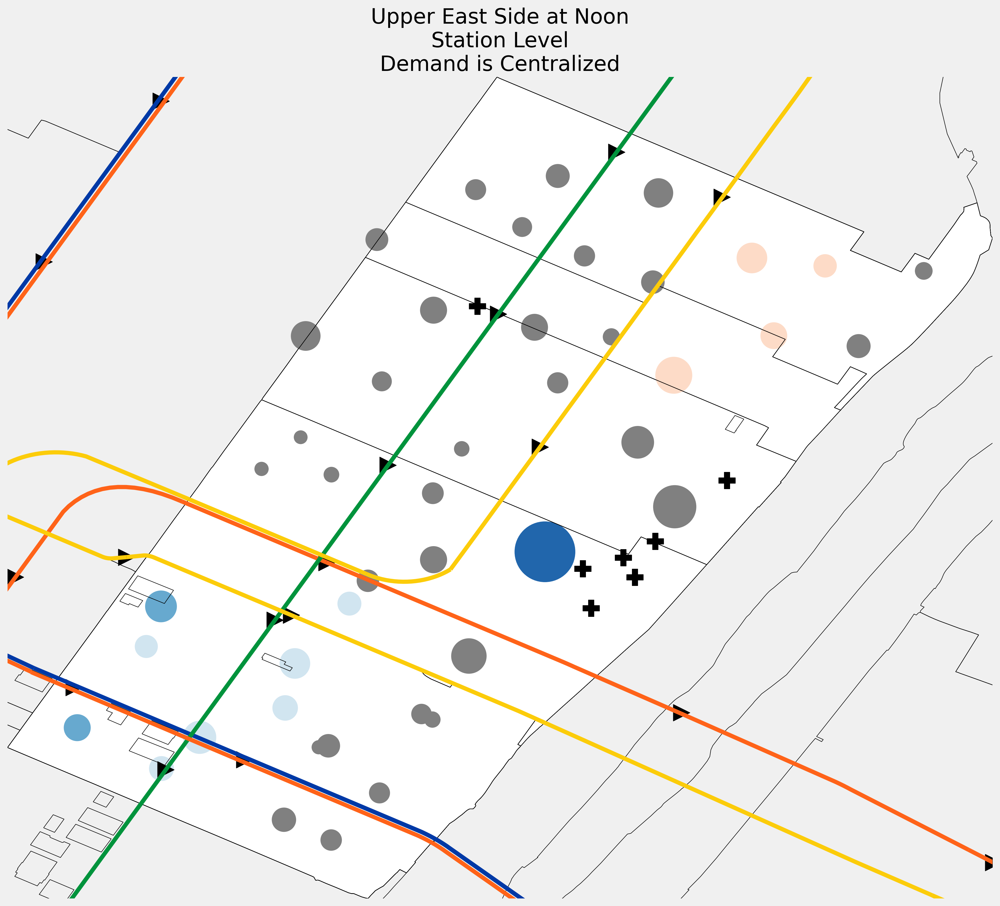

In [11]:

hour = 12

citi_hour = station_count[station_count['hour'] == hour]
citi_hour['total_trips'] = citi_hour['leaving'] + citi_hour['arriving']
citi_hour = citi_hour.merge(citi,how = 'left',
                        left_on = 'station', 
                        right_on = 'Start Station Name').drop_duplicates('station')

near_evil_zips = ['10021','10028','10065','10075','10022']

near_evil = citi_hour[citi_hour['start_zipcode'].isin(near_evil_zips)]
near_evil = near_evil[['station','net_day',
                       'Start Station Latitude','Start Station Longitude',
                       'start_zipcode','hour_x','total_trips']].reset_index(drop=True)

near_evil_zips = gnyc_zip.merge(near_evil, right_on='start_zipcode' ,left_on='ZIPCODE')

gnear_evil = geopandas.GeoDataFrame(
                near_evil, 
                geometry=geopandas.points_from_xy(near_evil['Start Station Longitude'], 
                                                  near_evil['Start Station Latitude']))

gnear_evil.loc[gnear_evil["net_day"] <= -12.5,
               "net_day_cat"] = -3
gnear_evil.loc[((gnear_evil["net_day"] > -12.5) & (gnear_evil["net_day"] <= -7.5)),
               "net_day_cat"] = -2
gnear_evil.loc[((gnear_evil["net_day"] > -7.5) & (gnear_evil["net_day"] <= -2.5)),
               "net_day_cat"] = -1
gnear_evil.loc[((gnear_evil["net_day"] > -2.5) & (gnear_evil["net_day"] <= 2.5)),
               "net_day_cat"] = 0
gnear_evil.loc[((gnear_evil["net_day"] > 2.5) & (gnear_evil["net_day"] <= 7.5)),
               "net_day_cat"] = 1
gnear_evil.loc[((gnear_evil["net_day"] > 7.5) & (gnear_evil["net_day"] <= 12.5)),
               "net_day_cat"] = 2
gnear_evil.loc[gnear_evil["net_day"] > 12.5, "net_day_cat"] = 3
cat_color_mapping = {-3:'#b2182b',
                     -2:'#ef8a62',
                     -1:'#fddbc7',
                     0:'grey',
                     1:'#d1e5f0',
                     2:'#67a9cf',
                     3:'#2166ac'}


fig,ax = plt.subplots(figsize = (15, 15))

zip_boundry_map = gnyc_zip.boundary.plot(color='Black', linewidth=.5,ax=ax)
near_evil_zips.plot(color='white', edgecolor='black',ax=zip_boundry_map)
gnear_evil.plot(ax=zip_boundry_map,
                color=gnear_evil["net_day_cat"].map(cat_color_mapping),
                markersize=near_evil['total_trips'],
                )

gsub_lines.plot(color=gsub_lines["rt_symbol"].map(subway_color_mapping),
                  ax=zip_boundry_map)
gsub_stations.plot(marker=">",markersize = 250,
                     ax=zip_boundry_map,color = 'black')
ghealth.plot(ax=zip_boundry_map,marker="P",markersize = 250,color='black')
# gschool.plot(ax=zip_boundry_map,marker="s",markersize = 250,color='#476072')
zip_boundry_map.axis('off')

ax.set_title('Upper East Side at Noon\nStation Level\nDemand is Centralized');



minx, miny, maxx, maxy = near_evil_zips.total_bounds
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)

plt.show()

<ipython-input-12-b500f78da500>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  citi_hour['total_trips'] = citi_hour['leaving'] + citi_hour['arriving']
<ipython-input-12-b500f78da500>:78: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  citi_hour['total_trips'] = citi_hour['leaving'] + citi_hour['arriving']


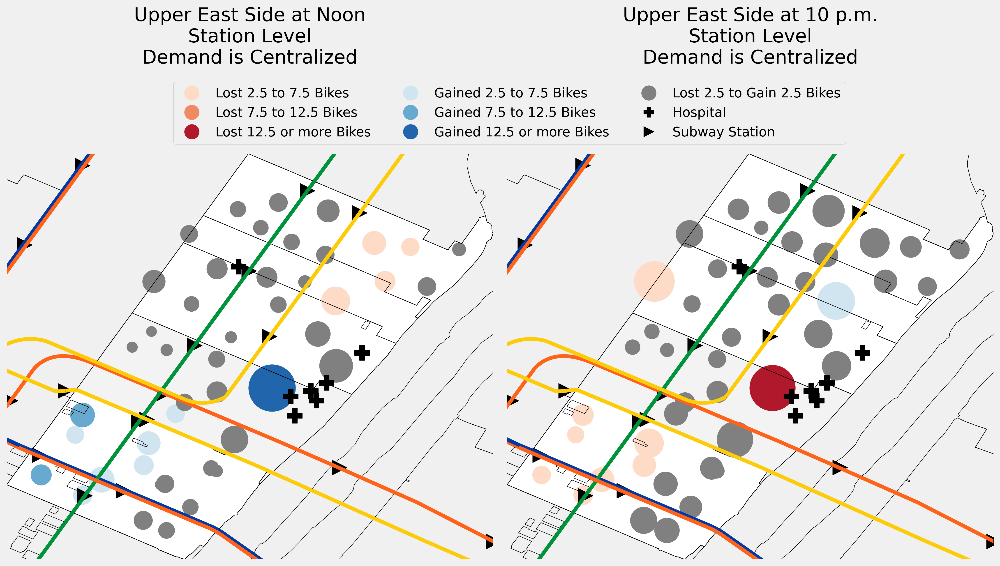

In [12]:
# create axis
fig,(ax1,ax2) = plt.subplots(1,2,figsize = (15, 15))
## set up data for graph
# limit data to hour of interest
hour = 12
citi_hour = station_count[station_count['hour'] == hour]
citi_hour['total_trips'] = citi_hour['leaving'] + citi_hour['arriving']
citi_hour = citi_hour.merge(citi,how = 'left',
                        left_on = 'station', 
                        right_on = 'Start Station Name').drop_duplicates('station')
# limit data to zip codes of interest
near_evil_zips = ['10021','10028','10065','10075','10022']
near_evil = citi_hour[citi_hour['start_zipcode'].isin(near_evil_zips)]
near_evil = near_evil[['station','net_day',
                       'Start Station Latitude','Start Station Longitude',
                       'start_zipcode','hour_x','total_trips']].reset_index(drop=True)
near_evil_zips = gnyc_zip.merge(near_evil, right_on='start_zipcode' ,left_on='ZIPCODE')
gnear_evil = geopandas.GeoDataFrame(
                near_evil, 
                geometry=geopandas.points_from_xy(near_evil['Start Station Longitude'], 
                                                  near_evil['Start Station Latitude']))
# bin net gain/loss values 
gnear_evil.loc[gnear_evil["net_day"] <= -12.5,
               "net_day_cat"] = -3
gnear_evil.loc[((gnear_evil["net_day"] > -12.5) & (gnear_evil["net_day"] <= -7.5)),
               "net_day_cat"] = -2
gnear_evil.loc[((gnear_evil["net_day"] > -7.5) & (gnear_evil["net_day"] <= -2.5)),
               "net_day_cat"] = -1
gnear_evil.loc[((gnear_evil["net_day"] > -2.5) & (gnear_evil["net_day"] <= 2.5)),
               "net_day_cat"] = 0
gnear_evil.loc[((gnear_evil["net_day"] > 2.5) & (gnear_evil["net_day"] <= 7.5)),
               "net_day_cat"] = 1
gnear_evil.loc[((gnear_evil["net_day"] > 7.5) & (gnear_evil["net_day"] <= 12.5)),
               "net_day_cat"] = 2
gnear_evil.loc[gnear_evil["net_day"] > 12.5, "net_day_cat"] = 3
# construct color mapping
cat_color_mapping = {-3:'#b2182b',
                     -2:'#ef8a62',
                     -1:'#fddbc7',
                     0:'grey',
                     1:'#d1e5f0',
                     2:'#67a9cf',
                     3:'#2166ac'}
zip_color_mapping = {'10021':'white', 
                     '10028':'white', 
                     '10065':'#f3f3f3', 
                     '10075':'white', 
                     '10022':'white'}
## graph map
# outline of zip codes
zip_boundry_map = gnyc_zip.boundary.plot(color='Black', linewidth=.5,ax=ax1)
# fill in zip codes of interest
near_evil_zips.plot(color=near_evil_zips['ZIPCODE'].map(zip_color_mapping), 
                    edgecolor='black',ax=zip_boundry_map)
# graph station traffic
gnear_evil.plot(ax=zip_boundry_map,
                color=gnear_evil["net_day_cat"].map(cat_color_mapping),
                markersize=near_evil['total_trips']*.75,)
# graph subway. lines and stations.
gsub_lines.plot(color=gsub_lines["rt_symbol"].map(subway_color_mapping),
                  ax=zip_boundry_map)
gsub_stations.plot(marker=">",markersize = 250,
                     ax=zip_boundry_map,color = 'black')
# graph hospital
ghealth.plot(ax=zip_boundry_map,marker="P",markersize = 250,color='black')
# limit map to areas of interest
zip_boundry_map.axis('off')
minx, miny, maxx, maxy = near_evil_zips.total_bounds
ax1.set_xlim(minx, maxx)
ax1.set_ylim(miny, maxy)
# title
ax1.set_title('Upper East Side at Noon\nStation Level\nDemand is Centralized\n\n\n\n');

## set up data for graph
# limit data to hour of interest
hour = 22
citi_hour = station_count[station_count['hour'] == hour]
citi_hour['total_trips'] = citi_hour['leaving'] + citi_hour['arriving']
citi_hour = citi_hour.merge(citi,how = 'left',
                        left_on = 'station', 
                        right_on = 'Start Station Name').drop_duplicates('station')
# limit data to zip codes of interest
near_evil_zips = ['10021','10028','10065','10075','10022']
near_evil = citi_hour[citi_hour['start_zipcode'].isin(near_evil_zips)]
near_evil = near_evil[['station','net_day',
                       'Start Station Latitude','Start Station Longitude',
                       'start_zipcode','hour_x','total_trips']].reset_index(drop=True)
near_evil_zips = gnyc_zip.merge(near_evil, right_on='start_zipcode' ,left_on='ZIPCODE')
gnear_evil = geopandas.GeoDataFrame(
                near_evil, 
                geometry=geopandas.points_from_xy(near_evil['Start Station Longitude'], 
                                                  near_evil['Start Station Latitude']))
# bin net gain/loss values 
gnear_evil.loc[gnear_evil["net_day"] <= -12.5,
               "net_day_cat"] = -3
gnear_evil.loc[((gnear_evil["net_day"] > -12.5) & (gnear_evil["net_day"] <= -7.5)),
               "net_day_cat"] = -2
gnear_evil.loc[((gnear_evil["net_day"] > -7.5) & (gnear_evil["net_day"] <= -2.5)),
               "net_day_cat"] = -1
gnear_evil.loc[((gnear_evil["net_day"] > -2.5) & (gnear_evil["net_day"] <= 2.5)),
               "net_day_cat"] = 0
gnear_evil.loc[((gnear_evil["net_day"] > 2.5) & (gnear_evil["net_day"] <= 7.5)),
               "net_day_cat"] = 1
gnear_evil.loc[((gnear_evil["net_day"] > 7.5) & (gnear_evil["net_day"] <= 12.5)),
               "net_day_cat"] = 2
gnear_evil.loc[gnear_evil["net_day"] > 12.5, "net_day_cat"] = 3
## graph map
# outline of zip codes
zip_boundry_map = gnyc_zip.boundary.plot(color='Black', linewidth=.5,ax=ax2)
# fill in zip codes of interest
near_evil_zips.plot(color=near_evil_zips['ZIPCODE'].map(zip_color_mapping), 
                    edgecolor='black',ax=zip_boundry_map)
# graph station traffic
gnear_evil.plot(ax=zip_boundry_map,
                color=gnear_evil["net_day_cat"].map(cat_color_mapping),
                markersize=near_evil['total_trips']*.75,)
# graph subway. lines and stations.
gsub_lines.plot(color=gsub_lines["rt_symbol"].map(subway_color_mapping),
                  ax=zip_boundry_map)
gsub_stations.plot(marker=">",markersize = 250,
                     ax=zip_boundry_map,color = 'black')
# graph hospital
ghealth.plot(ax=zip_boundry_map,marker="P",markersize = 250,color='black')
# limit map to areas of interest
zip_boundry_map.axis('off')
# minx, miny, maxx, maxy = near_evil_zips.total_bounds
ax2.set_xlim(minx, maxx)
ax2.set_ylim(miny, maxy)
# title
ax2.set_title('Upper East Side at 10 p.m.\nStation Level\nDemand is Centralized\n\n\n\n')
fig.tight_layout()
# legend
hospital = mlines.Line2D([], [], color='black', marker='P', linestyle='None',
                          markersize=10, label='Hospital')
subway = mlines.Line2D([], [], color='black', marker='>', linestyle='None',
                          markersize=10, label='Subway Station')
circle_3 = mlines.Line2D([], [], color='#b2182b', marker='.', linestyle='None',
                          markersize=30, label='Lost 12.5 or more Bikes')
circle_2 = mlines.Line2D([], [], color='#ef8a62', marker='.', linestyle='None',
                          markersize=30, label='Lost 7.5 to 12.5 Bikes')
circle_1 = mlines.Line2D([], [], color='#fddbc7', marker='.', linestyle='None',
                          markersize=30, label='Lost 2.5 to 7.5 Bikes')
circle = mlines.Line2D([], [], color='grey', marker='.', linestyle='None',
                          markersize=30, label='Lost 2.5 to Gain 2.5 Bikes')
circle1 = mlines.Line2D([], [], color='#d1e5f0', marker='.', linestyle='None',
                          markersize=30, label='Gained 2.5 to 7.5 Bikes')
circle2 = mlines.Line2D([], [], color='#67a9cf', marker='.', linestyle='None',
                          markersize=30, label='Gained 7.5 to 12.5 Bikes')
circle3 = mlines.Line2D([], [], color='#2166ac', marker='.', linestyle='None',
                          markersize=30, label='Gained 12.5 or more Bikes')
plt.legend(handles=[circle_1, circle_2, circle_3, circle1, circle2, circle3, circle, hospital, subway],
           loc='center left', bbox_to_anchor=(-.7, 1.1), frameon=True, ncol=3, title = '')
plt.show()

#### NYC Map

<ipython-input-13-3a59f9aef544>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  citi_hour['total_trips'] = citi_hour['leaving'] + citi_hour['arriving']


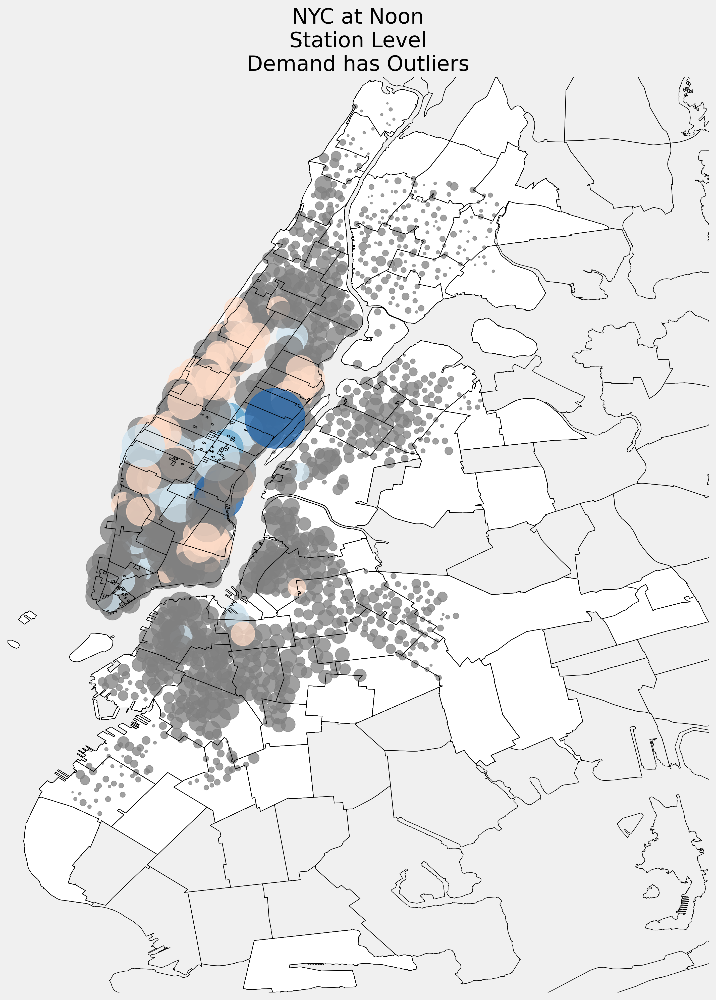

In [13]:
hour = 12

citi_hour = station_count[station_count['hour'] == hour]
citi_hour['total_trips'] = citi_hour['leaving'] + citi_hour['arriving']
citi_hour = citi_hour.merge(citi,how = 'left',
                        left_on = 'station', 
                        right_on = 'Start Station Name').drop_duplicates('station')
near_evil = citi_hour
near_evil = near_evil[['station','net_day',
                       'Start Station Latitude','Start Station Longitude',
                       'start_zipcode','hour_x','total_trips']].reset_index(drop=True)

near_evil_zips = gnyc_zip.merge(near_evil, right_on='start_zipcode' ,left_on='ZIPCODE')

gnear_evil = geopandas.GeoDataFrame(
                near_evil, 
                geometry=geopandas.points_from_xy(near_evil['Start Station Longitude'], 
                                                  near_evil['Start Station Latitude']))

gnear_evil.loc[gnear_evil["net_day"] <= -12.5,
               "net_day_cat"] = -3
gnear_evil.loc[((gnear_evil["net_day"] > -12.5) & (gnear_evil["net_day"] <= -7.5)),
               "net_day_cat"] = -2
gnear_evil.loc[((gnear_evil["net_day"] > -7.5) & (gnear_evil["net_day"] <= -2.5)),
               "net_day_cat"] = -1
gnear_evil.loc[((gnear_evil["net_day"] > -2.5) & (gnear_evil["net_day"] <= 2.5)),
               "net_day_cat"] = 0
gnear_evil.loc[((gnear_evil["net_day"] > 2.5) & (gnear_evil["net_day"] <= 7.5)),
               "net_day_cat"] = 1
gnear_evil.loc[((gnear_evil["net_day"] > 7.5) & (gnear_evil["net_day"] <= 12.5)),
               "net_day_cat"] = 2
gnear_evil.loc[gnear_evil["net_day"] > 12.5, "net_day_cat"] = 3
cat_color_mapping = {-3:'#b2182b',
                     -2:'#ef8a62',
                     -1:'#fddbc7',
                     0:'grey',
                     1:'#d1e5f0',
                     2:'#67a9cf',
                     3:'#2166ac'}

fig,ax = plt.subplots(figsize = (15, 15))

zip_boundry_map = gnyc_zip.boundary.plot(color='Black', linewidth=.5,ax=ax)
near_evil_zips.plot(color='white', edgecolor='black',ax=zip_boundry_map)
gnear_evil.plot(ax=zip_boundry_map,
                color=gnear_evil["net_day_cat"].map(cat_color_mapping),
                markersize=near_evil['total_trips'],
                alpha=.75)
zip_boundry_map.axis('off')



minx, miny, maxx, maxy = near_evil_zips.total_bounds
ax.set_xlim(minx, maxx)
ax.set_ylim(miny, maxy)

ax.set_title('NYC at Noon\nStation Level\nDemand has Outliers');



plt.show()